In [2]:
# torch18 环境
import torch
import torch_geometric as pyg
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
print(torch.__version__, pyg.__version__, nx.__version__)

1.8.1 1.7.0 2.5.1


In [64]:
# keras 环境
from GEmbedding.ge import *
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import csv
import numpy as np
import sklearn.metrics as mt

In [ ]:
# ! pip install cogdl

### 全图处理 获取节点

In [65]:
# md = pd.read_csv("datasets/data(MDA108)/m-d.csv",sep = ',', header = None)
# (r,c) = md.shape
# print(r,c)
md = pd.read_csv("/mnt/yzy/NIMCGCN/datasets/data(MDA108)/mirna_drug_1043_2166.txt",sep = ',', header = 0, index_col = 0)
(r,c) = md.shape
print(r,c)

1043 2166


In [66]:
drug_node = md.columns.to_list()
rna_node = md.index.to_list()
print(drug_node[:10],'\n',rna_node[:10],sep='')

['15', '119', '137', '176', '187', '190', '241', '243', '244', '247']
['hsa-let-7', 'hsa-let-7a', 'hsa-let-7a-1', 'hsa-let-7a-2', 'hsa-let-7a-3', 'hsa-let-7b', 'hsa-let-7c', 'hsa-let-7d', 'hsa-let-7e', 'hsa-let-7f']


In [67]:
print(md.index)
rna_null_node = []
row_sum = md.sum(axis = 1)
for i in range (0, 1043):
    if(row_sum[i] == 0):
        rna_null_node.append(md.index[i])
print(len(rna_null_node),'\n',rna_null_node)

# print('*'*30)

print(md.columns)
drug_null_node = []
col_sum = md.sum(axis = 0)
for i in range (0, 2166):
    if(col_sum[i] == 0):
        drug_null_node.append(md.columns[i])
print(len(drug_null_node),'\n',drug_null_node)

Index(['hsa-let-7', 'hsa-let-7a', 'hsa-let-7a-1', 'hsa-let-7a-2',
       'hsa-let-7a-3', 'hsa-let-7b', 'hsa-let-7c', 'hsa-let-7d', 'hsa-let-7e',
       'hsa-let-7f',
       ...
       'hsa-mir-944', 'hsa-mir-95', 'hsa-mir-9500', 'hsa-mir-9501',
       'hsa-mir-96', 'hsa-mir-98', 'hsa-mir-99', 'hsa-mir-99a', 'hsa-mir-99b',
       'hsa-mir-9a'],
      dtype='object', length=1043)
598 
 ['hsa-let-7', 'hsa-let-7a-2', 'hsa-let-7f-1', 'hsa-mir-1-1', 'hsa-mir-101-2', 'hsa-mir-103-1', 'hsa-mir-103a-1', 'hsa-mir-103a-2', 'hsa-mir-103b', 'hsa-mir-103b-1', 'hsa-mir-103b-2', 'hsa-mir-105-1', 'hsa-mir-105-2', 'hsa-mir-106', 'hsa-mir-112', 'hsa-mir-1178', 'hsa-mir-1179', 'hsa-mir-1180', 'hsa-mir-1182', 'hsa-mir-1183', 'hsa-mir-1184', 'hsa-mir-1184-1', 'hsa-mir-1185', 'hsa-mir-1202', 'hsa-mir-1206', 'hsa-mir-1207', 'hsa-mir-1224', 'hsa-mir-1225', 'hsa-mir-1226', 'hsa-mir-122a', 'hsa-mir-1231', 'hsa-mir-1233', 'hsa-mir-1233-1', 'hsa-mir-1233-2', 'hsa-mir-1234', 'hsa-mir-1236', 'hsa-mir-1237', 'hsa-mir

### 基本信息统计

In [46]:
# 列 -- drug
print("最大度数:",md.sum(axis = 0).max())
print("有边节点数:",(md.sum(axis = 0) != 0).sum() )
print("有边节点数:",(md.sum(axis = 0) == 0).sum() )

最大度数: 118
有边节点数: 135
有边节点数: 2031


In [45]:
# 行 -- mirna
print("最大度数:",md.sum(axis = 1).max())
print("有边节点数:",(md.sum(axis = 1) != 0).sum() )
print("无边节点数:",(md.sum(axis = 1) == 0).sum() )

最大度数: 33
有边节点数: 445
无边节点数: 598


In [26]:
x = []
y = []
for i in range(0,int(r)):
    for j in range(0, int(c)):
        # print("{},{}".format(i,j))
        if(md.iloc[i,j] == 1):
            x.append(i)
            y.append(j)

In [33]:
print(len(x),len(y))
adj = pd.DataFrame(data = {"x":x, "y":y} , index = None, columns = None, dtype = int)
adj.to_csv("datasets/data(MDA108)/Graph_edge_list.csv", header = None, index = None, sep=' ')

1430 1430


### 全图可视化

In [26]:
G = nx.read_edgelist("/mnt/yzy/NIMCGCN/datasets/data(MDA108)/Graph_edge_list.txt",create_using=nx.Graph(),nodetype=None)

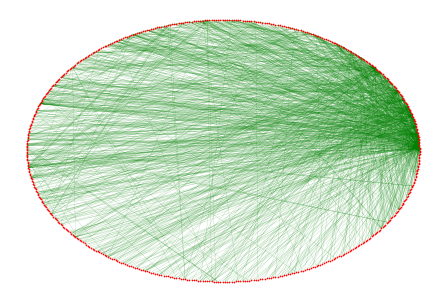

In [32]:
nx.draw(G, pos=nx.circular_layout(G), node_size = 0.5, node_color = 'r', edge_color = 'g', width = 0.1)
plt.savefig("visual_graph.png", dpi = 600)

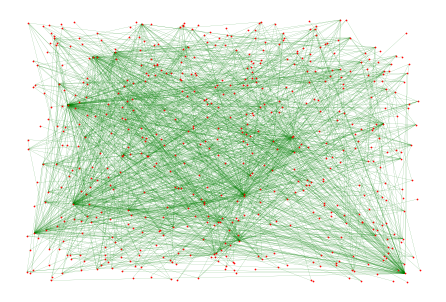

In [47]:
nx.draw(G, pos=nx.random_layout(G), node_size = 0.5, node_color = 'r', edge_color = 'g', width = 0.1)

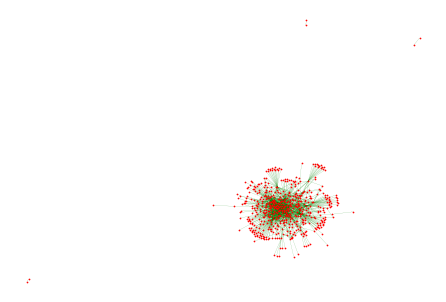

In [48]:
nx.draw(G, pos=nx.spring_layout(G), node_size = 0.5, node_color = 'r', edge_color = 'g', width = 0.1)

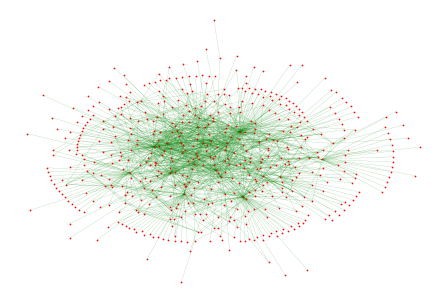

In [49]:
nx.draw(G, pos=nx.kamada_kawai_layout(G) , node_size = 0.5, node_color = 'r', edge_color = 'g', width = 0.1)

In [2]:
! pwd
! cd GEmbedding 
! pwd
! ls

/mnt/yzy/NIMCGCN
/mnt/yzy/NIMCGCN
dataset.py	 GEmbedding    MMcode	   READMD.md  SSI-DDI
datasets	 GraphDTA      NIMCcode    README.md  TorchTest.py
embedding.ipynb  metric.ipynb  outcome.md  runs       visual_graph.png


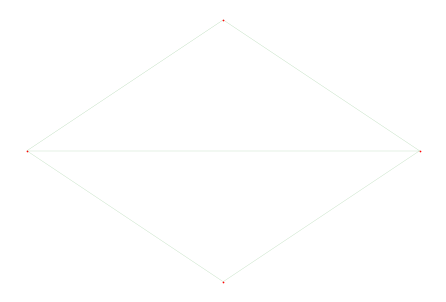

In [4]:
# wiki示例数据
G = nx.read_edgelist("/mnt/yzy/NIMCGCN/GEmbedding/tests/Wiki_edgelist.txt",create_using=nx.Graph(),nodetype=None)
nx.draw(G, pos=nx.circular_layout(G), node_size = 0.5, node_color = 'r', edge_color = 'g', width = 0.1)

In [4]:
G = nx.read_edgelist('/mnt/yzy/NIMCGCN/datasets/data(MDA108)/Graph_edge_list.txt',
                     create_using=nx.Graph(), nodetype=None, data=[('weight', int)])

model = DeepWalk(G, walk_length=10, num_walks=80, workers=1)
model.train(window_size=5, iter=3)
embeddings = model.get_embeddings()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished


Learning embedding vectors...
Learning embedding vectors done!


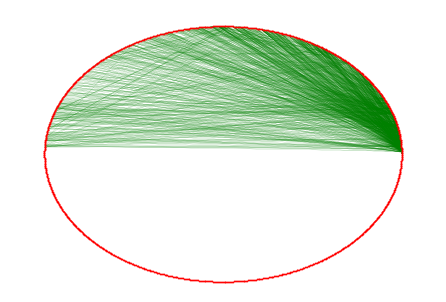

In [9]:
G = nx.read_edgelist('/mnt/yzy/NIMCGCN/datasets/data(MDA108)/mirna_drug_entry_1043_2166.txt',
                     delimiter = ',', create_using=nx.Graph(), nodetype=str, data=[('weight', int)])
for itm in rna_null_node:
    G.add_node(itm)
nx.draw(G, pos=nx.circular_layout(G), node_size = 0.5, node_color = 'r', edge_color = 'g', width = 0.1)

### DeepWalk 全图训练 获取Embedding

In [68]:
model = DeepWalk(G, walk_length=10, num_walks=80, workers=1)
model.train(window_size=5, iter=3)
embeddings = model.get_embeddings()
print(len(embeddings))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished


Learning embedding vectors...
Learning embedding vectors done!
1172


In [13]:
embeddings

{'hsa-let-7a': array([-3.3132955e-02,  1.9303505e-01,  1.7020336e-01,  1.4961395e-01,
         9.7673275e-02,  4.5089949e-02, -4.3249283e-02, -5.7676405e-01,
         2.4596193e-01,  5.4889059e-01, -3.3863619e-02,  1.4592165e-01,
        -3.1714109e-01, -2.7746232e-02,  7.8235686e-02,  4.9383488e-01,
        -4.6772337e-01, -8.2132764e-02, -2.0919826e-02,  8.1357521e-01,
        -6.7772157e-03,  2.8140154e-02, -3.6539665e-01, -5.8049244e-01,
        -1.8457593e-01,  3.9535755e-01, -1.8481705e-01, -2.9252473e-01,
        -1.9668899e-02, -4.7250316e-01,  5.3614069e-02, -1.3215458e-01,
        -3.5965762e-01,  1.9492424e-01, -2.7467021e-01, -1.1607215e-01,
        -1.5391697e-01, -2.3215955e-01, -9.7989440e-02, -3.0181849e-01,
        -1.8305135e-01,  2.5103050e-01,  6.7066669e-04, -4.7064984e-01,
         3.9934531e-02,  3.4174505e-01,  9.9007018e-02, -2.8597149e-01,
        -8.7553963e-02,  1.3061281e-01,  1.8685719e-01, -2.5827858e-01,
         3.9695483e-02, -1.4650165e-01,  5.2919644

In [23]:
rna_embeddings = []
for rna in rna_node:
    rna_embeddings.append(embeddings[rna])

rna_embeddings = np.array(rna_embeddings)
print(rna_embeddings.shape)

(1043, 128)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.1s finished


Learning embedding vectors...
Learning embedding vectors done!
{'hsa-let-7a': array([ 1.17548294e-02,  5.03905043e-02, -1.63526118e-01,  1.92416608e-01,
       -2.85110295e-01,  1.92722768e-01, -7.08178664e-03, -1.72955170e-01,
        1.30692884e-01,  6.89479649e-01, -7.63699114e-02,  1.24001443e-01,
       -4.55366641e-01, -2.32496634e-01,  7.01177180e-01,  6.41590238e-01,
       -6.02967501e-01, -5.41713655e-01, -3.51583511e-01,  5.93841732e-01,
        4.05447125e-01, -3.66733670e-01, -9.63919833e-02, -7.58868158e-01,
       -6.97944760e-01,  3.36522721e-02, -1.37199253e-01, -2.18145326e-01,
       -4.37399119e-01, -1.21352226e-01, -2.38421127e-01,  8.38000253e-02,
        4.36898842e-02, -5.35769641e-01, -4.34469283e-02,  1.05653077e-01,
        2.25694299e-01, -1.47188887e-01, -1.80622950e-01,  1.27763018e-01,
       -2.01552466e-01,  3.12727168e-02, -2.81825271e-02, -2.50036091e-01,
        6.23577058e-01, -1.15801021e-01, -2.69519478e-01, -1.72025979e-01,
       -9.93307233e-02

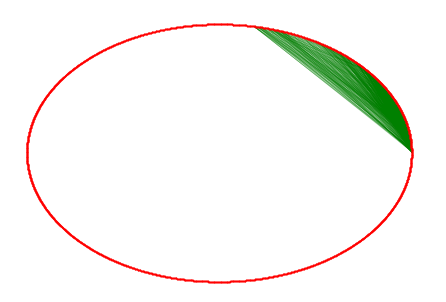

In [69]:
G = nx.read_edgelist('/mnt/yzy/NIMCGCN/datasets/data(MDA108)/mirna_drug_entry_1043_2166.txt',
                     delimiter = ',', create_using=nx.Graph(), nodetype=str, data=[('weight', int)])
for itm in drug_null_node:
    G.add_node(itm)
nx.draw(G, pos=nx.circular_layout(G), node_size = 0.5, node_color = 'r', edge_color = 'g', width = 0.1)

model = DeepWalk(G, walk_length=10, num_walks=80, workers=1)
model.train(window_size=5, iter=3)
embeddings = model.get_embeddings()
print(embeddings)
print(len(embeddings))

In [70]:
drug_embeddings = []
for drug in drug_node:
    drug_embeddings.append(embeddings[drug])

drug_embeddings = np.array(drug_embeddings)
print(drug_embeddings.shape)

(2166, 128)


In [71]:
ground_truth = pd.read_csv("/mnt/yzy/NIMCGCN/datasets/data(MDA108)/m-d.csv",delimiter=',',header=None)
ground_truth = ground_truth.values
print(ground_truth.shape)

(1043, 2166)


In [72]:
prediction = rna_embeddings @ drug_embeddings.T
print(prediction.shape)

(1043, 2166)


In [73]:
# 训练时看到了整张图 不正确
import numpy as np
import sklearn.metrics as mt

print(mt.roc_auc_score(ground_truth.reshape(-1),prediction.reshape(-1)))

0.9136115075291223


### 数据集切分

In [74]:
print(len(drug_node),":",drug_node)
print(len(rna_node),":",rna_node)
print(md.shape)
rr = int(r / 10)    # 行列数10等分
cc = int(c / 10)

2166 : ['15', '119', '137', '176', '187', '190', '241', '243', '244', '247', '280', '281', '305', '311', '338', '444', '460', '544', '564', '586', '598', '612', '679', '681', '702', '712', '727', '750', '753', '757', '774', '784', '785', '807', '896', '936', '938', '946', '947', '948', '977', '978', '985', '988', '996', '999', '1004', '1023', '1030', '1031', '1032', '1046', '1051', '1054', '1060', '1089', '1091', '1110', '1123', '1130', '1175', '1176', '1207', '1674', '1676', '1727', '1775', '1832', '1923', '1935', '1978', '1981', '1983', '1986', '1989', '1990', '1993', '2082', '2083', '2088', '2092', '2099', '2118', '2123', '2130', '2131', '2132', '2140', '2141', '2145', '2148', '2153', '2157', '2159', '2160', '2161', '2162', '2164', '2165', '2170', '2179', '2187', '2194', '2197', '2200', '2202', '2206', '2216', '2236', '2244', '2247', '2249', '2265', '2266', '2267', '2284', '2315', '2327', '2335', '2336', '2337', '2343', '2345', '2350', '2351', '2353', '2365', '2366', '2368', '2369',

In [75]:
print(len(rna_node[rr:]),md[rr:].shape)
print(md[rr:].values.sum(axis=0).sum(axis=0))

939 (939, 2166)
1223


In [76]:
all_edge = []
with open("/mnt/yzy/NIMCGCN/datasets/data(MDA108)/mirna_drug_entry_1043_2166.txt", 'r', encoding = 'utf-8') as f:
    reader = csv.reader(f)
    for row in reader:
        all_edge.append(row)


### 单次交叉验证

In [77]:
# rna图
Gr = nx.Graph()

for node in rna_node:
    Gr.add_node(node)

for (na,nb) in all_edge:
    if na in rna_node[rr:]:
        Gr.add_edge(na,nb)

print("节点数：", Gr.number_of_nodes())
print("边数：", Gr.number_of_edges())
print("节点列表：", Gr.nodes())
print("边列表：", Gr.edges())

Gd = nx.Graph()

for node in drug_node:
    Gd.add_node(node)

for (na,nb) in all_edge:
    if na in rna_node[rr:]:
        Gd.add_edge(na,nb)

print("节点数：", Gd.number_of_nodes())
print("边数：", Gd.number_of_edges())
print("节点列表：", Gd.nodes())
print("边列表：", Gd.edges())

节点数： 1172
边数： 1223
节点列表： ['hsa-let-7', 'hsa-let-7a', 'hsa-let-7a-1', 'hsa-let-7a-2', 'hsa-let-7a-3', 'hsa-let-7b', 'hsa-let-7c', 'hsa-let-7d', 'hsa-let-7e', 'hsa-let-7f', 'hsa-let-7f-1', 'hsa-let-7f-2', 'hsa-let-7g', 'hsa-let-7i', 'hsa-mir-1', 'hsa-mir-1-1', 'hsa-mir-1-2', 'hsa-mir-10', 'hsa-mir-100', 'hsa-mir-101', 'hsa-mir-101-1', 'hsa-mir-101-2', 'hsa-mir-103', 'hsa-mir-103-1', 'hsa-mir-103a', 'hsa-mir-103a-1', 'hsa-mir-103a-2', 'hsa-mir-103b', 'hsa-mir-103b-1', 'hsa-mir-103b-2', 'hsa-mir-105', 'hsa-mir-105-1', 'hsa-mir-105-2', 'hsa-mir-106', 'hsa-mir-106a', 'hsa-mir-106b', 'hsa-mir-107', 'hsa-mir-10a', 'hsa-mir-10b', 'hsa-mir-112', 'hsa-mir-1178', 'hsa-mir-1179', 'hsa-mir-1180', 'hsa-mir-1181', 'hsa-mir-1182', 'hsa-mir-1183', 'hsa-mir-1184', 'hsa-mir-1184-1', 'hsa-mir-1185', 'hsa-mir-1202', 'hsa-mir-1206', 'hsa-mir-1207', 'hsa-mir-122', 'hsa-mir-1224', 'hsa-mir-1225', 'hsa-mir-1226', 'hsa-mir-1227', 'hsa-mir-1228', 'hsa-mir-1229', 'hsa-mir-122a', 'hsa-mir-1231', 'hsa-mir-1233', 'hs

In [78]:
model = DeepWalk(Gr, walk_length=10, num_walks=80, workers=1)
model.train(window_size=5, iter=3)
gr_embeddings = model.get_embeddings()

model = DeepWalk(Gd, walk_length=10, num_walks=80, workers=1)
model.train(window_size=5, iter=3)
gd_embeddings = model.get_embeddings()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.6s finished


Learning embedding vectors...
Learning embedding vectors done!


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.0s finished


Learning embedding vectors...
Learning embedding vectors done!


In [79]:
rna_embeddings = []
for rna in rna_node:
    rna_embeddings.append(gr_embeddings[rna])

rna_embeddings = np.array(rna_embeddings)
print(rna_embeddings.shape)

drug_embeddings = []
for drug in drug_node:
    drug_embeddings.append(gd_embeddings[drug])

drug_embeddings = np.array(drug_embeddings)
print(drug_embeddings.shape)

(1043, 128)
(2166, 128)


In [80]:
ground_truth = pd.read_csv("/mnt/yzy/NIMCGCN/datasets/data(MDA108)/m-d.csv",delimiter=',',header=None)
ground_truth = ground_truth.values
print(ground_truth.shape)

prediction = rna_embeddings @ drug_embeddings.T
print(prediction.shape)

print('AUC:',mt.roc_auc_score(ground_truth.reshape(-1),prediction.reshape(-1)))

(1043, 2166)
(1043, 2166)
AUC: 0.90892835438988


In [104]:
print(prediction.shape)
p = np.empty([0,2166])
print(p.shape)
print(prediction[0:rr].shape)
print(prediction[2*rr:3*rr].shape)

print(np.concatenate((prediction[0:rr],prediction[2*rr:3*rr]),axis = 0).shape)
print(np.concatenate((p,prediction[2*rr:3*rr]),axis = 0).shape)

(1043, 2166)
(0, 2166)
(104, 2166)
(104, 2166)
(208, 2166)
(104, 2166)
